# Seismic image Classification  
This notebook is an experiment to see if a pre-trained image classifier can classify seismic images as seismic_clean, seismic_noisy, noise  

Use `ml` env  to run this notebook

In [27]:
import os
from PIL import Image
from obspy.io.segy.segy import _read_segy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch 
import torchvision
from fastcore import *

In [28]:
filename = './MP36-08_PSTM_STK.sgy'
segy = _read_segy(filename)
print(len(segy.traces))

2649


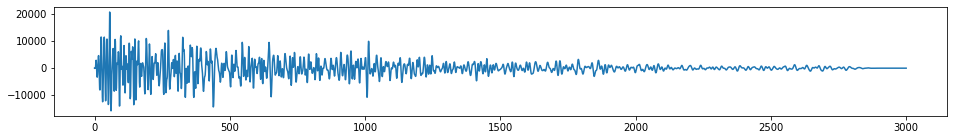

In [29]:
# first trace
one_trace = segy.traces[0]

plt.figure(figsize=(16,2))
plt.plot(one_trace.data)
plt.show()

In [30]:
# converting into numpy array 
stack = np.stack([trace.data for trace in segy.traces])
print(stack.shape)
# stack = np.transpose(stack)

# clipping data to 99th percentile
v99 = np.percentile(stack, 99)
stack = np.clip(stack, a_min=-1*v99 , a_max = v99)

# normalise 
normalised_stack = (stack - stack.min()) / (stack.max() - stack.min())
normalised_stack = np.transpose(normalised_stack)

(2649, 3001)


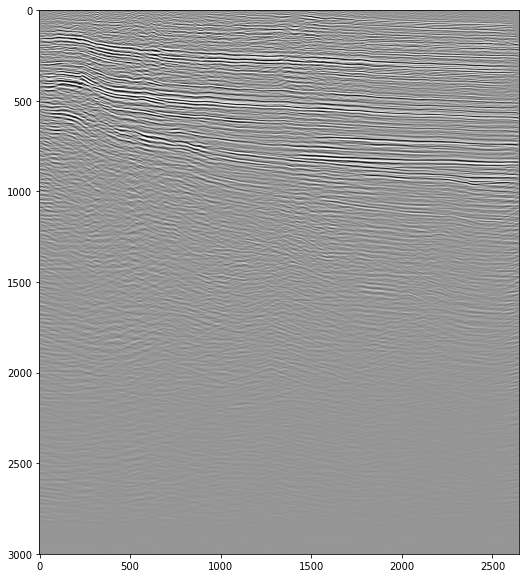

In [31]:
# visualisation
plt.figure(figsize=(20,10))
plt.imshow(normalised_stack, cmap='Greys');

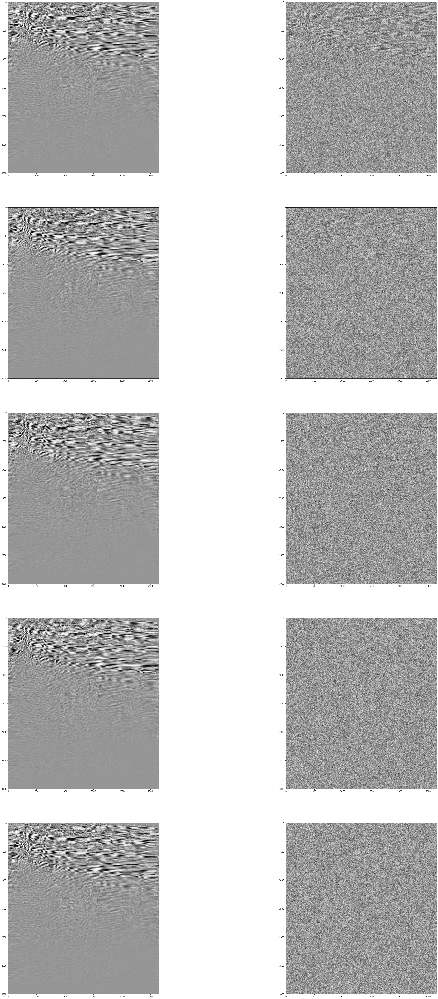

In [32]:
# noisy stack , 
np.random.seed(50)

noise_factor = 0.1

def add_noise(stack, noise_factor) : 
    noisy_stack = stack + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=stack.shape) 
    return np.clip(noisy_stack, a_min=0, a_max=1)
    
noisy_stack_1 = add_noise(normalised_stack, 1)
noisy_stack_2 = add_noise(normalised_stack, 2)
noisy_stack_3 = add_noise(normalised_stack, 3)
noisy_stack_4 = add_noise(normalised_stack, 4) 
noisy_stack_5 = add_noise(normalised_stack, 5)

noise = np.random.normal(loc=0.0, scale=1.0, size=normalised_stack.shape) 

stacks = [normalised_stack, noisy_stack_1, normalised_stack, noisy_stack_2, normalised_stack,noisy_stack_3, normalised_stack,noisy_stack_4, normalised_stack,noisy_stack_5]
# visualisation
plt.figure(figsize=(45,90))

for i in range(10) : 
    ax = plt.subplot(5,2,i+1)
    plt.imshow(stacks[i], cmap='Greys');

In [33]:
def generate_patches(stack, patch_size=80) : 
    # patch size = 80
    stride = patch_size 
    patches =  torch.from_numpy(stack).unfold(0,patch_size,stride).unfold(1,patch_size,stride).permute(2, 3, 0, 1).reshape(-1, patch_size, patch_size)
    patch3d = patches.expand([3,-1,-1,-1]).permute(1,0,2,3)
    return patch3d # generates a tensor of shape ( patch_no, patch_size, patch_size)

patch_size = 128

normalised_stack_patches = generate_patches(normalised_stack,patch_size)
noisy_stack_1_patches = generate_patches(noisy_stack_1,patch_size)
noisy_stack_2_patches = generate_patches(noisy_stack_2, patch_size)
noisy_stack_3_patches = generate_patches(noisy_stack_3,patch_size)
noisy_stack_4_patches = generate_patches(noisy_stack_4, patch_size)
noisy_stack_5_patches = generate_patches(noisy_stack_5,patch_size)
noise_patches = generate_patches(noise, patch_size)


In [34]:
# save patches to folders 
def save_patches(stack, image_folder, image_name) : 

    os.makedirs(image_folder, exist_ok=True)
    for i in range(stack.shape[0]) : 
        patch  = stack[i]
        
        torchvision.utils.save_image(patch, f'{image_folder}/{image_name}_{i}.png')
    return

# clean vs noisy dataset     
save_patches(normalised_stack_patches, './seismic_patch_data/clean_stack','seismic_clean_')
save_patches(noise_patches, './seismic_patch_data/noise_patches','noise_')
# save_patches(noisy_stack_1_patches, './noisy_patches_1','seismic_noisy_1_')
# save_patches(noisy_stack_2_patches, './noisy_patches_2','seismic_noisy_2_')
# save_patches(noisy_stack_3_patches, './noisy_patches_3','seismic_noisy_3_')
# save_patches(noisy_stack_4_patches, './noisy_patches_4','seismic_noisy_4_')
# save_patches(noisy_stack_5_patches, './noisy_patches_5','seismic_noisy_5_')
# save_patches(noise_patches, './noise_patches','noise_')


In [35]:
normalised_stack_patches.shape[0]

460

In [36]:
normalised_stack_patches[1,:].shape

torch.Size([3, 128, 128])

In [37]:
# Fast ai classifier
from fastai.vision.all import * 

path = Path('seismic_patch_data')

dls = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.1, seed=42),
    get_y = parent_label,
).dataloaders(path)


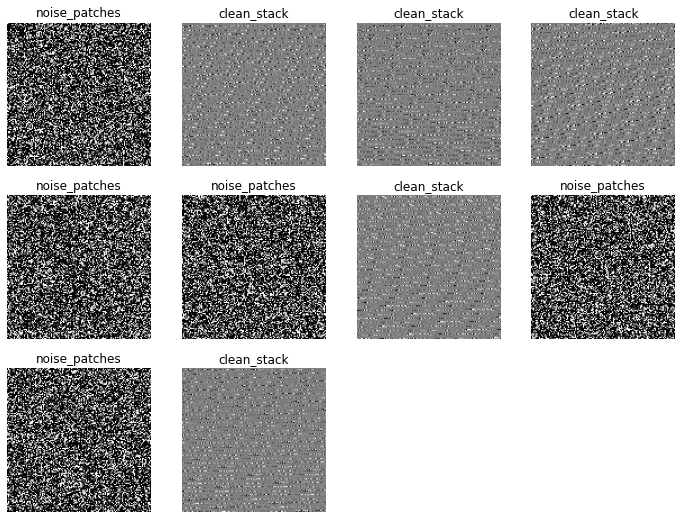

In [38]:
dls.show_batch(max_n = 10)

In [39]:
dls.train_ds[0][0].shape

(128, 128)

In [40]:
# model training using datablock 
learn = vision_learner(dls,resnet18, metrics=error_rate)
learn.fine_tune(5)

/Users/jayanthboddu/miniforge3/envs/ml/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/Users/jayanthboddu/miniforge3/envs/ml/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,error_rate,time


[W ParallelNative.cpp:229] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:229] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:229] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:229] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNative.cpp:229] Warning: Cannot set number of intraop threads after parallel work has started or after set_num_threads call when using native parallel backend (function set_num_threads)
[W ParallelNati

KeyboardInterrupt: 

In [ ]:
help(learn.fine_tune)

Help on method fine_tune in module fastai.callback.schedule:

fine_tune(epochs, base_lr=0.002, freeze_epochs=1, lr_mult=100, pct_start=0.3, div=5.0, lr_max=None, div_final=100000.0, wd=None, moms=None, cbs=None, reset_opt=False, start_epoch=0) method of fastai.learner.Learner instance
    Fine tune with `Learner.freeze` for `freeze_epochs`, then with `Learner.unfreeze` for `epochs`, using discriminative LR.

